# Import libraries

In [1]:
# Importing required modules
import pandas as pd
from openai import OpenAI
from tenacity import retry, stop_after_attempt, wait_random_exponential
import io
import os
import json
import asyncio
from openai import AsyncOpenAI
import time

In [2]:
from dotenv import load_dotenv
# Load the .env file
load_dotenv()

True

In [3]:
import logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s',
                        handlers=[
        logging.FileHandler("../data/find_promises_log_20250301.log"),  # Log messages are written to this file
        logging.StreamHandler()  # Log messages are also printed to the console
    ]
)

In [4]:
import nest_asyncio
nest_asyncio.apply()

# Prepare the database

In [5]:
transcripts = pd.read_pickle("../data/sxp1500_presentations_ceo.pkl")

In [6]:
## select only if is_ceo is True
transcripts = transcripts[transcripts['is_ceo'] == True]

In [7]:
transcripts.columns

Index(['companyid', 'keydevid', 'transcriptid', 'headline',
       'mostimportantdateutc', 'mostimportanttimeutc', 'keydeveventtypeid',
       'keydeveventtypename', 'companyname', 'transcriptcollectiontypeid',
       'transcriptcollectiontypename', 'transcriptpresentationtypeid',
       'transcriptpresentationtypename', 'transcriptcreationdate_utc',
       'transcriptcreationtime_utc', 'audiolengthsec', 'isdelayed_flag',
       'delayreasontypeid', 'delayreasontypename', 'transcriptcomponentid',
       'componentorder', 'transcriptcomponenttypeid',
       'transcriptcomponenttypename', 'transcriptpersonid',
       'transcriptpersonname', 'proid', 'companyofperson', 'speakertypeid',
       'speakertypename', 'componenttextpreview', 'word_count',
       'componenttext', 'gvkey', 'year', 'matched_name', 'exec_fullname',
       'execid', 'is_ceo'],
      dtype='object')

In [8]:


# Assuming 'transcripts' is your dataframe
# First, sort the dataframe by 'transcriptid' and 'componentorder'
transcripts_sorted = transcripts.sort_values(by=['transcriptid', 'componentorder'])

# Group by 'transcriptid' and aggregate the data
aggregated_transcripts = transcripts_sorted.groupby('transcriptid').agg({
    'transcriptcomponentid': lambda x: list(x),  # Create a list of 'transcriptcomponentid's
    'componenttext': ' '.join,  # Combine 'componenttext' separated by a space
    # For all other columns, just keep the first value
    **{col: 'first' for col in transcripts.columns.difference(['transcriptid', 'transcriptcomponentid', 'componenttext'])}
}).reset_index()

# Rename columns to match the new structure
aggregated_transcripts.rename(columns={
    'transcriptcomponentid': 'transcriptcomponentid_list',
    'componenttext': 'transcript_text'
}, inplace=True)

# Now 'aggregated_transcripts' contains the desired output


In [9]:
# print the transcript_text for 3 random transcripts
print(aggregated_transcripts['transcript_text'].sample(3).values)

['Good morning. Thanks for joining us. This morning we\'ll review the results of the third quarter, we\'ll update our guidance for the balance of 2010, and we\'ll provide our initial outlook for 2011.\nThis is a good news conference call. We had a very good third quarter. We believe that 2010 will finish up in line with our guidance, and we\'re looking for an earnings per share increase in 2011 of 15%. We\'ll talk more about 2011 in a few minutes.\nBack to this quarter. Sales in the quarter, $537 million, up 21% from a year ago. Incidentally, the comparisons with the third quarter of \'09 are actually pretty easy comparisons. That quarter was our weakest sales quarter in \'09. The recession was really having its effect on us then, particularly in our Industrial business, and we expensed in that quarter almost $10 million worth of restructuring charges.  Nevertheless, there are some comparisons that I think are worth making. \nCompared to the same quarter a year ago, our gross margin th

In [10]:
aggregated_transcripts['transcript_text_len'] = aggregated_transcripts['transcript_text'].apply(len)
aggregated_transcripts['transcriptcomponentid_ceospeech'] = aggregated_transcripts['transcriptcomponentid_list'].apply(lambda x: x[0])


<Axes: >

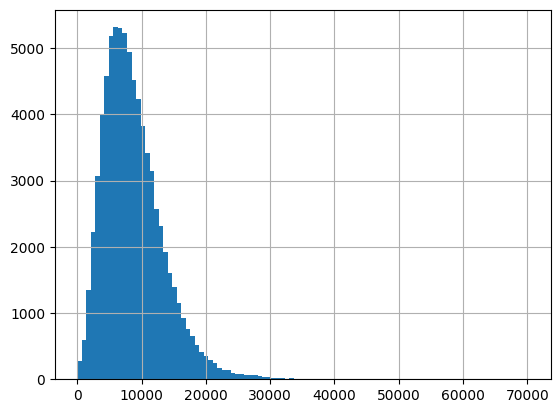

In [11]:
# plot the distribution of transcript_text_len
aggregated_transcripts['transcript_text_len'].hist(bins=100)

In [12]:
aggregated_transcripts = aggregated_transcripts[(aggregated_transcripts['year']>2009) & (aggregated_transcripts['year']<2023)]

In [13]:
# reset index to start from 0
aggregated_transcripts.reset_index(drop=True, inplace=True)

In [14]:
aggregated_transcripts['processed'] = 0

In [15]:
aggregated_transcripts.to_pickle("../data/sxp1500_presentations_ceo_aggregated.pkl")

# Sample prompt and response

In [17]:
with open("../data/gpt_prompts/promise_system_message.txt", "r") as f:
    system_message = f.read().strip()

In [18]:
print(system_message)

You are an equity research analyst working at a prestigous investment banking institution.'

Your job is to read through earnings conference calls transcripts and identify promises that CEOs have made.

Adhere meticulously to the instructions provided to you. Identify promises according to the specific definition of a promise as provided to you.

Always verify the accuracy of your work. Be as meticulous as a finance professor.

Outputs are always in JSON format as specified.


In [19]:
with open("../data/gpt_prompts/promise_user_message.txt", "r") as f:
    user_message_template = f.read().strip()

In [20]:
print(user_message_template)   

Instructions: ```
Your task is to identify promises within the provided earnings call presentation text. Use the definitions and criteria provided below to guide your analysis. The text of the earnings call is enclosed within triple backticks for clarity.
```

Theoretical Definition of a CEO Promise: ```
We define a CEO promise as a publicly communicated, future-oriented statement in which a firm’s chief executive conveys a commitment to deliver a favorable, firm-specific action or outcome, thereby creating an expectation that not fulfilling this commitment will harm the CEO or the organization’s credibility and reputation among external stakeholders.


The definition includes the following components:
1. Publicly Communicated. A statement qualifies as a CEO promise only if delivered in a forum accessible to external audiences (e.g., earnings calls, press conferences, investor presentations). By making the commitment visible to outsiders, the CEO elevates accountability and reputationa

In [21]:
def create_user_message(row, user_message_template):
    user_message = user_message_template.replace("[company_name_placeholder]", row["companyname"]) \
        .replace("[date_placeholder]", str(row["mostimportantdateutc"])) \
        .replace("[presenter_name_placeholder]", row["transcriptpersonname"]) \
        .replace("[presentation_text_placeholder]", row["transcript_text"])
    return user_message


In [32]:
user_message1 = create_user_message(aggregated_transcripts.iloc[34440], user_message_template)

In [33]:
print(user_message1)

Instructions: ```
Your task is to identify promises within the provided earnings call presentation text. Use the definitions and criteria provided below to guide your analysis. The text of the earnings call is enclosed within triple backticks for clarity.
```

Theoretical Definition of a CEO Promise: ```
We define a CEO promise as a publicly communicated, future-oriented statement in which a firm’s chief executive conveys a commitment to deliver a favorable, firm-specific action or outcome, thereby creating an expectation that not fulfilling this commitment will harm the CEO or the organization’s credibility and reputation among external stakeholders.


The definition includes the following components:
1. Publicly Communicated. A statement qualifies as a CEO promise only if delivered in a forum accessible to external audiences (e.g., earnings calls, press conferences, investor presentations). By making the commitment visible to outsiders, the CEO elevates accountability and reputationa

In [25]:
# Set up your OpenAI API key
client = OpenAI(
  api_key="....", 
)

In [26]:
with open("../data/gpt_prompts/promise_system_message.txt", "r") as f:
    system_message = f.read().strip()
with open("../data/gpt_prompts/promise_user_message.txt", "r") as f:
    user_message_template = f.read().strip()


In [35]:

# Call the ChatGPT API with the system message and the generated user message
response = client.chat.completions.create(
    model="o3-mini-2025-01-31",
    reasoning_effort="high",
    messages=[
        {"role": "developer", "content": system_message},
        {"role": "user", "content": create_user_message(aggregated_transcripts.iloc[25100], user_message_template)}
    ],
    seed=2023,
    response_format = {"type":"json_object"},
)

# Extract the message content from the first choice in the response
print(response.choices[0].message.content)


2025-02-11 11:39:09,758 - INFO - HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"


{
  "promises": [
    {
      "1-promise-verbatim": "We're on track to complete the spinoff of the Power Generation business by midsummer in line with our original time line.",
      "2-promise-explain": "The CEO is committing to finalize the planned separation (spinoff) of the Power Generation business, which is intended to create two independent companies. This move is aimed at enhancing strategic focus and shareholder value and is clearly aimed at a favorable outcome.",
      "3-promise-delivery-time": "midsummer 2015",
      "4-promise-horizon": "2-3",
      "5-commitment-degree": "strong-commitment",
      "6-self-evaluation": "This statement meets the criteria for a CEO promise. It is publicly communicated during the earnings call, is clearly future-oriented with a defined time frame (midsummer), expresses a commitment to complete a firm-specific, beneficial strategic action, and is materially significant to the firm's structure and shareholder perception. Therefore, it qualifies

In [28]:
print(response.usage.completion_tokens)

8786


In [29]:
print(response.usage.prompt_tokens)

4137


# Get promises batch

### Opening a sample of familiar firms transcripts
The goal is to test the batch processing functions


In [36]:
# selecting a list of familiar companies, just for manual coding efficiency purposes
aggregated_transcripts.companyname.drop_duplicates().to_excel("../data/familiar_companies.xlsx", index=False)

In [37]:
familiar_companies = pd.read_excel("../data/familiar_companies_select.xlsx")
sample_transcripts = aggregated_transcripts[aggregated_transcripts['companyname'].isin(familiar_companies['companyname'])].sample(10)
sample_transcripts['processed'] = 0
sample_transcripts.to_pickle("../data/sample_transcripts.pkl")

## Setting the parameters

In [21]:
# Adjust these values based on your needs
CONCURRENT_REQUESTS = 250  # Maximum number of concurrent requests
TIMEOUT = 240  # Timeout in seconds for each request

# Constants
batch_size = 1000  # Number of requests after which to checkpoint
save_file = '../data/sxp1500_presentations_ceo_aggregated_promises.pkl'

# for sample run
#initial_file = '../data/sample_transcripts.pkl'

# for full run
initial_file = '../data/sxp1500_presentations_ceo_aggregated.pkl'

promise_system_message_file = "../data/gpt_prompts/promise_system_message.txt"
promise_user_message_file = "../data/gpt_prompts/promise_user_message.txt"

open_ai_api_key="..."

## Batch promise identification functions

In [22]:
def create_user_message(row, user_message_template):
    user_message = user_message_template.replace("[company_name_placeholder]", row["companyname"]) \
        .replace("[date_placeholder]", str(row["mostimportantdateutc"])) \
        .replace("[presenter_name_placeholder]", row["transcriptpersonname"]) \
        .replace("[presentation_text_placeholder]", row["transcript_text"])
    return user_message


In [23]:
with open(promise_system_message_file, "r") as f:
    system_message = f.read().strip()
with open(promise_user_message_file, "r") as f:
    user_message_template = f.read().strip()

    
client = AsyncOpenAI(api_key=open_ai_api_key)

# Semaphore to control the number of concurrent requests
semaphore = asyncio.Semaphore(CONCURRENT_REQUESTS)


In [24]:

@retry(stop=stop_after_attempt(3), wait=wait_random_exponential(multiplier=1, max=10))
async def fetch_chat_completion(system_message, user_message, index):
    async with semaphore:
        logging.info(f"Processing request for row {index}")
        try:
            response = await asyncio.wait_for(client.chat.completions.create(
                model="o3-mini-2025-01-31",
                reasoning_effort="high",
                seed=2025,
                response_format={"type": "json_object"},
                messages=[
                    {"role": "developer", "content": system_message},
                    {"role": "user", "content": user_message}
                ]
            ), TIMEOUT)
            logging.info(f"Completed request for row {index}")
            return response
        except Exception as e:
            logging.error(f"Error in request for row {index}: {e}")
            return None

async def process_rows(df, BATCH_SIZE, save_file):
    df_non_processed = df[df['processed'] == 0]

    total_prompt_tokens = 0
    total_completion_tokens = 0

    for start_index in range(0, len(df_non_processed), BATCH_SIZE):
        end_index = start_index + BATCH_SIZE
        batch_df = df_non_processed.iloc[start_index:end_index]
        
        task_list = [
            (index, asyncio.create_task(fetch_chat_completion(system_message, create_user_message(row, user_message_template), index)))
            for index, row in batch_df.iterrows()
        ]
        responses = await asyncio.gather(*[task for index, task in task_list], return_exceptions=True)
        
        for (index, _), response in zip(task_list, responses):
            if isinstance(response, Exception):
                df.at[index, 'result'] = None
            elif response is None or pd.isna(response.choices[0].message.content) or response.choices[0].message.content == '' or response.choices[0].message.content == 'None':
                df.at[index, 'result'] = None

                try:
                    total_prompt_tokens += response.usage.prompt_tokens
                except:
                    pass
            else:
                df.at[index, 'result'] = response.choices[0].message.content
                df.at[index, 'processed'] = 1

                try:
                    total_prompt_tokens += response.usage.prompt_tokens
                    total_completion_tokens += response.usage.completion_tokens
                except:
                    pass

        # Save intermediate results
        df.to_pickle(save_file)
        

    # Account for responses that are None, NaN, or empty
    df['result'] = df['result'].replace('', None).replace(float('nan'), None)
    df.to_pickle(save_file)
    return df, total_prompt_tokens, total_completion_tokens


# Running the asynchronous tasks with checkpointing
async def main(batch_size, save_file, initial_file):
    # check if save file exists
    if os.path.exists(save_file):
        transcripts = pd.read_pickle(save_file)
    else:
        transcripts = pd.read_pickle(initial_file)

    # Process remaining rows
    results_df, total_prompt_tokens, total_completion_tokens = await process_rows(transcripts, batch_size, save_file)
    return results_df, total_prompt_tokens, total_completion_tokens



In [25]:
# Execute the main function in Jupyter notebook
results, total_prompt_tokens, total_completion_tokens = await main(batch_size, save_file, initial_file)


2025-02-11 12:21:58,776 - INFO - Processing request for row 0
2025-02-11 12:21:58,776 - INFO - Processing request for row 1
2025-02-11 12:21:58,777 - INFO - Processing request for row 2
2025-02-11 12:21:58,777 - INFO - Processing request for row 3
2025-02-11 12:21:58,778 - INFO - Processing request for row 4
2025-02-11 12:21:58,778 - INFO - Processing request for row 5
2025-02-11 12:21:58,779 - INFO - Processing request for row 6
2025-02-11 12:21:58,779 - INFO - Processing request for row 7
2025-02-11 12:21:58,780 - INFO - Processing request for row 8
2025-02-11 12:21:58,780 - INFO - Processing request for row 9
2025-02-11 12:21:58,781 - INFO - Processing request for row 10
2025-02-11 12:21:58,781 - INFO - Processing request for row 11
2025-02-11 12:21:58,782 - INFO - Processing request for row 12
2025-02-11 12:21:58,782 - INFO - Processing request for row 13
2025-02-11 12:21:58,783 - INFO - Processing request for row 14
2025-02-11 12:21:58,783 - INFO - Processing request for row 15
20

In [26]:
results.to_pickle("../data/sxp1500_presentations_ceo_aggregated_promises_backup.pkl")

# Parse the promises

In [27]:

def parse_promises(json_str):
    # Check for NaN (note: pd.isna also checks for None)
    if pd.isna(json_str) or json_str == '':
        return []

    try:
        # Parse the JSON string
        data = json.loads(json_str)

        # Extract the list of promises
        return data.get("promises", [])
    except json.JSONDecodeError:
        # Return empty list in case of invalid JSON
        return []


In [28]:

# Apply the function to each row in the 'result_content' column
results['parsed_promises'] = results['result'].apply(parse_promises)


In [29]:

# Use explode to create a new row for each item in the parsed_promises list
exploded_df = results.explode('parsed_promises')

# Reset index to get a clean DataFrame
exploded_df.reset_index(drop=True, inplace=True)

# If you want to split the dictionary into separate columns, you can use:
exploded_df = exploded_df.join(pd.json_normalize(exploded_df['parsed_promises']))

# Optionally, drop the original 'parsed_promises' column if it's no longer needed
exploded_df.drop(columns=['parsed_promises'], inplace=True)


In [30]:
exploded_df.to_pickle("../data/sxp1500_presentations_ceo_aggregated_promises_expanded.pkl")

In [31]:
# remove column transcript_text
exploded_df.drop(columns=['transcript_text'], inplace=True)

In [33]:
exploded_df.to_pickle("../data/sxp1500_presentations_ceo_aggregated_promise_expanded_notext.pkl")

In [34]:
exploded_df.to_csv("../data/sxp1500_presentations_ceo_aggregated_promises_expanded_notext.csv")

# Some exploratory analysis

In [35]:
exploded_df.columns

Index(['transcriptid', 'transcriptcomponentid_list', 'audiolengthsec',
       'companyid', 'companyname', 'companyofperson', 'componentorder',
       'componenttextpreview', 'delayreasontypeid', 'delayreasontypename',
       'exec_fullname', 'execid', 'gvkey', 'headline', 'is_ceo',
       'isdelayed_flag', 'keydeveventtypeid', 'keydeveventtypename',
       'keydevid', 'matched_name', 'mostimportantdateutc',
       'mostimportanttimeutc', 'proid', 'speakertypeid', 'speakertypename',
       'transcriptcollectiontypeid', 'transcriptcollectiontypename',
       'transcriptcomponenttypeid', 'transcriptcomponenttypename',
       'transcriptcreationdate_utc', 'transcriptcreationtime_utc',
       'transcriptpersonid', 'transcriptpersonname',
       'transcriptpresentationtypeid', 'transcriptpresentationtypename',
       'word_count', 'year', 'transcript_text_len',
       'transcriptcomponentid_ceospeech', 'processed', 'result',
       '1-promise-verbatim', '2-promise-explain', '3-promise-delive

In [36]:
# descriptives for the values of these columns: '5-commitment-degree', '7-is-promise', '8-financial-guidance'
print(exploded_df['5-commitment-degree'].value_counts())
print(exploded_df['7-is-promise'].value_counts())
print(exploded_df['8-financial-guidance'].value_counts())


5-commitment-degree
moderate-commitment                                                                     86026
strong-commitment                                                                       79861
no-commitment                                                                              50
strong                                                                                     19
moderate                                                                                   15
strong-commitment for study results                                                         1
low-commitment                                                                              1
strong-commitment (for the testing phase)                                                   1
strong-commitment for the debt repayment; moderate-commitment for the synergy target        1
Name: count, dtype: int64
7-is-promise
yes          165505
uncertain       413
no               57
Name: count, dtype: int64
8-financi

In [37]:
# keep when 7-is-promise is 'yes' or 'Yes'
# keep when 8-financial-guidance is 'no' or 'No'
# keep when 5-commitment-degree is 'high-commitment' or 'High-commitment'
# new df is called promises_df
promises_df = exploded_df[(exploded_df['7-is-promise'] == 'yes') & (exploded_df['8-financial-guidance'] == 'no') & (exploded_df['5-commitment-degree'] == 'strong-commitment')]

In [40]:
promises_df['transcriptid'].value_counts().describe()

count    41466.000000
mean         1.785005
std          1.262261
min          1.000000
25%          1.000000
50%          1.000000
75%          2.000000
max         25.000000
Name: count, dtype: float64